# Cross-Camera Player Mapping

This notebook demonstrates the step-by-step process of tracking and matching players across multiple camera views.

## 1. Setup and Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image

# Import our modules
from src.detect import PlayerDetector
from src.feature_extractor import FeatureExtractor
from src.matcher import PlayerMatcher

# Configure matplotlib for notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 10)

## 2. Load Videos and Initialize Components

In [2]:
# Set paths
broadcast_path = 'broadcast.mp4'
tacticam_path = 'tacticam.mp4'
weights_path = 'best.pt'

# Initialize components
detector = PlayerDetector(weights_path=weights_path)
feature_extractor = FeatureExtractor()
matcher = PlayerMatcher()

# Load videos
broadcast_cap = cv2.VideoCapture(broadcast_path)
tacticam_cap = cv2.VideoCapture(tacticam_path)

print(f"Broadcast video: {int(broadcast_cap.get(cv2.CAP_PROP_FRAME_COUNT))} frames")
print(f"Tactical camera: {int(tacticam_cap.get(cv2.CAP_PROP_FRAME_COUNT))} frames")

Loading YOLO model from best.pt...


c:\Users\jayes\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jayes\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Broadcast video: 132 frames
Tactical camera: 201 frames


## 3. Test Player Detection

Detecting players in broadcast view...


0: 384x640 3 players, 1746.0ms
Speed: 47.4ms preprocess, 1746.0ms inference, 37.0ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 3 players, 1746.0ms
Speed: 47.4ms preprocess, 1746.0ms inference, 37.0ms postprocess per image at shape (1, 3, 384, 640)
Found 3 players in broadcast view

Detecting players in tactical view...

Found 3 players in broadcast view

Detecting players in tactical view...

0: 384x640 22 players, 2 referees, 1523.6ms
Speed: 10.6ms preprocess, 1523.6ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 22 players, 2 referees, 1523.6ms
Speed: 10.6ms preprocess, 1523.6ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)
Found 24 players in tactical view
Found 24 players in tactical view


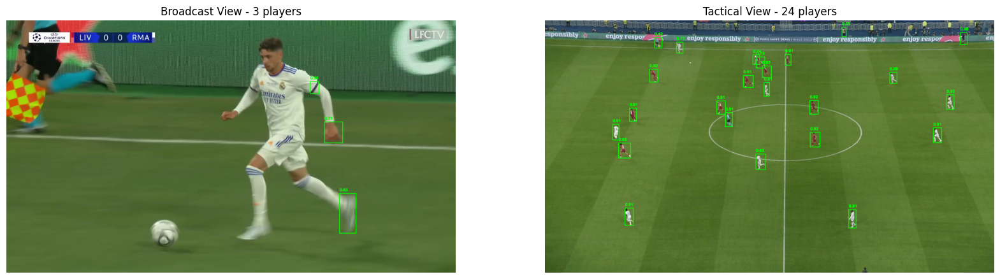

In [3]:
def show_detections(frame, detections):
    frame_with_boxes = frame.copy()
    for x1, y1, x2, y2, conf in detections:
        cv2.rectangle(frame_with_boxes, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame_with_boxes, f'{conf:.2f}', (int(x1), int(y1)-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return frame_with_boxes

# Get a frame from each video
ret1, broadcast_frame = broadcast_cap.read()
ret2, tacticam_frame = tacticam_cap.read()

if ret1 and ret2:
    # Detect players
    print("Detecting players in broadcast view...")
    broadcast_detections = detector.detect(broadcast_frame)
    print(f"Found {len(broadcast_detections)} players in broadcast view")
    
    print("\nDetecting players in tactical view...")
    tacticam_detections = detector.detect(tacticam_frame)
    print(f"Found {len(tacticam_detections)} players in tactical view")
    
    # Draw detections
    broadcast_viz = show_detections(broadcast_frame, broadcast_detections)
    tacticam_viz = show_detections(tacticam_frame, tacticam_detections)
    
    # Display results
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(broadcast_viz, cv2.COLOR_BGR2RGB))
    plt.title(f'Broadcast View - {len(broadcast_detections)} players')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(tacticam_viz, cv2.COLOR_BGR2RGB))
    plt.title(f'Tactical View - {len(tacticam_detections)} players')
    plt.axis('off')
    plt.show()

## 4. Feature Extraction and Visualization

Extracting features from players...


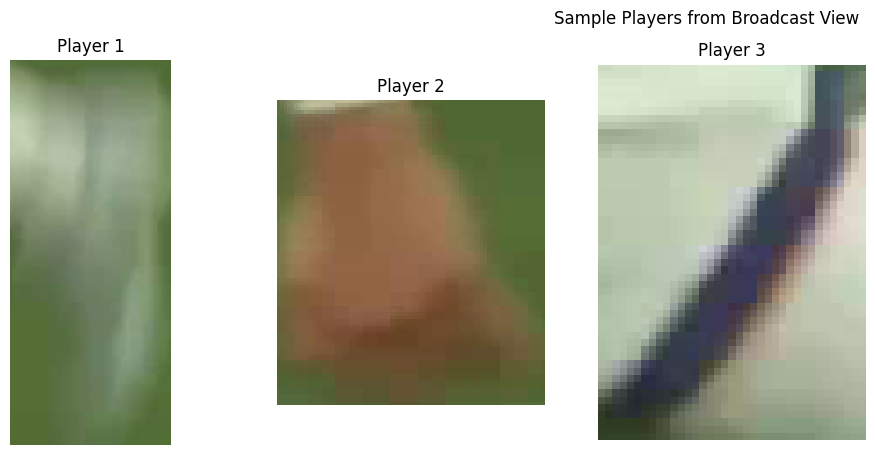

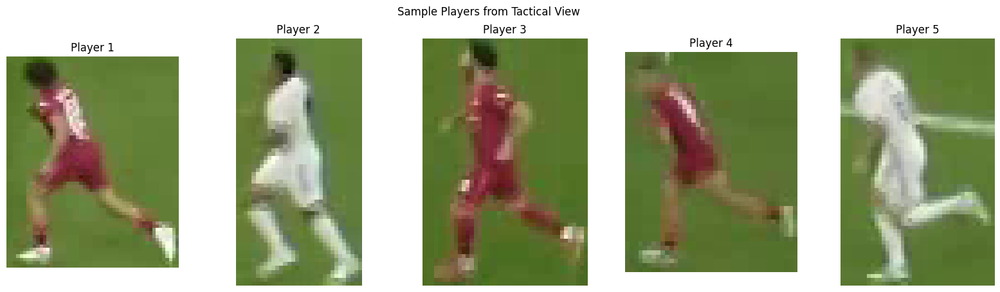

In [4]:
def extract_player_patches(frame, detections):
    patches = []
    for x1, y1, x2, y2, _ in detections:
        patch = frame[int(y1):int(y2), int(x1):int(x2)]
        patches.append(patch)
    return patches

# Extract player patches if detections are available
if 'broadcast_detections' in locals() and len(broadcast_detections) > 0:
    # Extract player patches
    broadcast_patches = extract_player_patches(broadcast_frame, broadcast_detections)
    tacticam_patches = extract_player_patches(tacticam_frame, tacticam_detections)
    
    # Extract features
    print("Extracting features from players...")
    broadcast_features = feature_extractor.extract(broadcast_frame, broadcast_detections)
    tacticam_features = feature_extractor.extract(tacticam_frame, tacticam_detections)
    
    # Display some player patches
    plt.figure(figsize=(20, 5))
    for i, patch in enumerate(broadcast_patches[:5]):
        plt.subplot(1, 5, i+1)
        plt.imshow(cv2.cvtColor(patch, cv2.COLOR_BGR2RGB))
        plt.title(f'Player {i+1}')
        plt.axis('off')
    plt.suptitle('Sample Players from Broadcast View')
    plt.show()
    
    plt.figure(figsize=(20, 5))
    for i, patch in enumerate(tacticam_patches[:5]):
        plt.subplot(1, 5, i+1)
        plt.imshow(cv2.cvtColor(patch, cv2.COLOR_BGR2RGB))
        plt.title(f'Player {i+1}')
        plt.axis('off')
    plt.suptitle('Sample Players from Tactical View')
    plt.show()

## 5. Player Matching Across Cameras

Matching players across cameras...


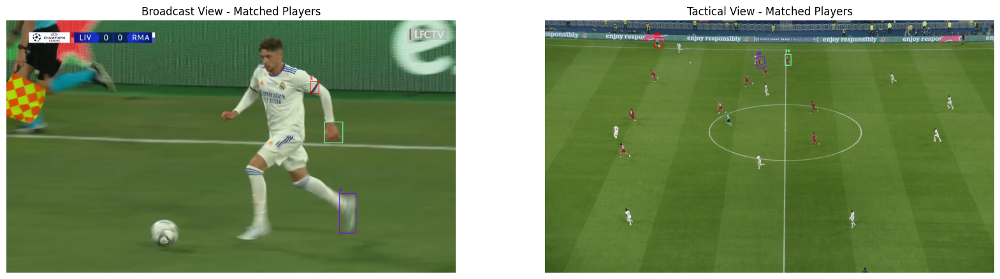


Player Matches:
broadcast_0 -> tacticam_20
broadcast_1 -> tacticam_14
broadcast_2 -> tacticam_22


In [5]:
def visualize_matches(broadcast_frame, tacticam_frame, broadcast_detections, tacticam_detections, matches):
    # Create copies for visualization
    broadcast_viz = broadcast_frame.copy()
    tacticam_viz = tacticam_frame.copy()
    
    # Draw matched players with same color and ID
    colors = plt.cm.rainbow(np.linspace(0, 1, len(matches)))
    colors = [(int(c[2]*255), int(c[1]*255), int(c[0]*255)) for c in colors]
    
    for (broadcast_id, tacticam_id), color in zip(matches.items(), colors):
        b_idx = int(broadcast_id.split('_')[1])
        t_idx = int(tacticam_id.split('_')[1])
        
        # Draw boxes and IDs
        b_det = broadcast_detections[b_idx]
        t_det = tacticam_detections[t_idx]
        
        # Broadcast view
        cv2.rectangle(broadcast_viz, (int(b_det[0]), int(b_det[1])), 
                     (int(b_det[2]), int(b_det[3])), color, 2)
        cv2.putText(broadcast_viz, str(b_idx), (int(b_det[0]), int(b_det[1])-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        # Tactical view
        cv2.rectangle(tacticam_viz, (int(t_det[0]), int(t_det[1])), 
                     (int(t_det[2]), int(t_det[3])), color, 2)
        cv2.putText(tacticam_viz, str(t_idx), (int(t_det[0]), int(t_det[1])-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return broadcast_viz, tacticam_viz

# Match players if detections and features are available
if 'broadcast_features' in locals():
    # Match players
    print("Matching players across cameras...")
    
    # Convert lists to arrays and ensure proper dimensions
    broadcast_features_array = np.array(broadcast_features, dtype=object)
    tacticam_features_array = np.array(tacticam_features, dtype=object)
    
    # Check if we need to stack the arrays
    if len(broadcast_features) > 0:
        if isinstance(broadcast_features[0], np.ndarray):
            broadcast_features_array = np.stack(broadcast_features)
        else:
            # If already an array, ensure it's 2D
            broadcast_features_array = np.atleast_2d(broadcast_features_array)
    
    if len(tacticam_features) > 0:
        if isinstance(tacticam_features[0], np.ndarray):
            tacticam_features_array = np.stack(tacticam_features)
        else:
            # If already an array, ensure it's 2D
            tacticam_features_array = np.atleast_2d(tacticam_features_array)
    
    # Ensure features are 2D for cosine distance calculation
    if len(broadcast_features) > 0 and broadcast_features_array.ndim > 2:
        broadcast_features_array = broadcast_features_array.reshape(broadcast_features_array.shape[0], -1)
    
    if len(tacticam_features) > 0 and tacticam_features_array.ndim > 2:
        tacticam_features_array = tacticam_features_array.reshape(tacticam_features_array.shape[0], -1)
    
    # Print debug info
    # Instead of this (incorrect: passing full array as one element):
# [(broadcast_detections, broadcast_features_array)]

# Do this: match per-player features
    broadcast_tracks = [(broadcast_detections[i], broadcast_features_array[i]) for i in range(len(broadcast_features_array))]
    tacticam_tracks = [(tacticam_detections[i], tacticam_features_array[i]) for i in range(len(tacticam_features_array))]

    matches = matcher.match_across_cameras(broadcast_tracks, tacticam_tracks)

    
    # Visualize matches
    broadcast_viz, tacticam_viz = visualize_matches(
        broadcast_frame, tacticam_frame, 
        broadcast_detections, tacticam_detections, matches
    )
    
    # Display results
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(broadcast_viz, cv2.COLOR_BGR2RGB))
    plt.title('Broadcast View - Matched Players')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(tacticam_viz, cv2.COLOR_BGR2RGB))
    plt.title('Tactical View - Matched Players')
    plt.axis('off')
    plt.show()
    
    # Print matches
    print("\nPlayer Matches:")
    for broadcast_id, tacticam_id in matches.items():
        print(f"{broadcast_id} -> {tacticam_id}")

## 6. Process Multiple Frames

In [6]:
def normalize_features(features_list, target_dim=None):
    if len(features_list) == 0:
        return np.empty((0, target_dim if target_dim else 0))

    # Convert to numpy array and flatten
    processed = [np.array(f).flatten() for f in features_list]

    # Find the max feature length (or use target_dim if provided)
    max_len = max(len(f) for f in processed) if target_dim is None else target_dim

    # Pad or truncate each feature
    padded = np.array([
        np.pad(f, (0, max_len - len(f)), mode='constant') if len(f) < max_len else f[:max_len]
        for f in processed
    ])

    return padded


Processing a sequence of frames...
Processing frame 1/5...

Processing frame 1/5...

0: 384x640 3 players, 1158.5ms
Speed: 2.8ms preprocess, 1158.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 players, 1158.5ms
Speed: 2.8ms preprocess, 1158.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 players, 2 referees, 1583.6ms
Speed: 3.8ms preprocess, 1583.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 22 players, 2 referees, 1583.6ms
Speed: 3.8ms preprocess, 1583.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 2/5...

Processing frame 2/5...

0: 384x640 2 players, 1097.9ms
Speed: 2.5ms preprocess, 1097.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 players, 1097.9ms
Speed: 2.5ms preprocess, 1097.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 players, 1 referee, 1276.4ms
Speed: 2.6ms

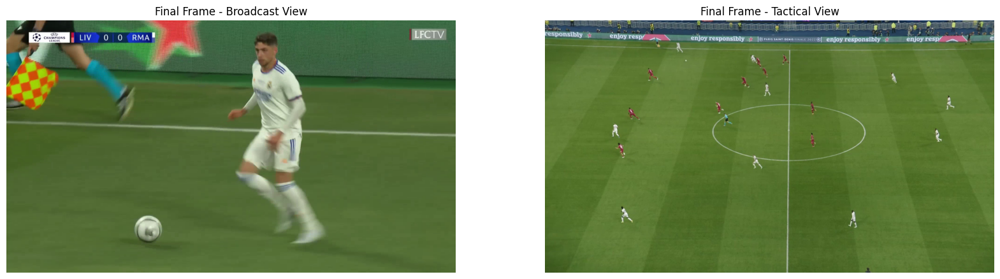

In [7]:
def process_frame_sequence(broadcast_cap, tacticam_cap, num_frames=5):
    # Reset video positions to the beginning
    broadcast_cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
    tacticam_cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
    
    all_matches = []
    
    for frame_idx in range(num_frames):
        ret1, broadcast_frame = broadcast_cap.read()
        ret2, tacticam_frame = tacticam_cap.read()
        
        if not (ret1 and ret2):
            break
            
        print(f"Processing frame {frame_idx+1}/{num_frames}...")
        
        # Detect and extract features
        broadcast_detections = detector.detect(broadcast_frame)
        tacticam_detections = detector.detect(tacticam_frame)
        
        broadcast_features = feature_extractor.extract(broadcast_frame, broadcast_detections)
        tacticam_features = feature_extractor.extract(tacticam_frame, tacticam_detections)
        
        # Normalize features to same length
        broadcast_features_array = normalize_features(broadcast_features)
        tacticam_features_array = normalize_features(tacticam_features, target_dim=broadcast_features_array.shape[1])

        
        # Make sure features have the right shape
        if len(broadcast_features) > 0 and len(broadcast_features_array.shape) == 1:
            broadcast_features_array = np.stack(broadcast_features)
            
        if len(tacticam_features) > 0 and len(tacticam_features_array.shape) == 1:
            tacticam_features_array = np.stack(tacticam_features)
            
        # Create a single feature vector for each player if needed
        if len(broadcast_features) > 0 and len(broadcast_features_array.shape) > 2:
            broadcast_features_array = broadcast_features_array.reshape(broadcast_features_array.shape[0], -1)
            
        if len(tacticam_features) > 0 and len(tacticam_features_array.shape) > 2:
            tacticam_features_array = tacticam_features_array.reshape(tacticam_features_array.shape[0], -1)
        
        # Match players
        matches = matcher.match_across_cameras(
            [(broadcast_detections, broadcast_features_array)],
            [(tacticam_detections, tacticam_features_array)]
        )
        
        all_matches.append((matches, broadcast_frame, tacticam_frame, broadcast_detections, tacticam_detections))
        
    return all_matches

# Process a small sequence of frames (5 frames)
print("Processing a sequence of frames...")
all_matches = process_frame_sequence(broadcast_cap, tacticam_cap, num_frames=5)

print(f"\nProcessed {len(all_matches)} frames")

# Visualize the last processed frame
if all_matches:
    matches, broadcast_frame, tacticam_frame, broadcast_detections, tacticam_detections = all_matches[-1]
    
    print("\nSample matches from last frame:")
    for broadcast_id, tacticam_id in matches.items():
        print(f"{broadcast_id} -> {tacticam_id}")
    
    # Visualize the last frame matches
    broadcast_viz, tacticam_viz = visualize_matches(
        broadcast_frame, tacticam_frame, 
        broadcast_detections, tacticam_detections, 
        matches
    )
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(broadcast_viz, cv2.COLOR_BGR2RGB))
    plt.title('Final Frame - Broadcast View')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(tacticam_viz, cv2.COLOR_BGR2RGB))
    plt.title('Final Frame - Tactical View')
    plt.axis('off')
    plt.show()

## 7. Clean up Resources

In [8]:
broadcast_cap.release()
tacticam_cap.release()

# Close all OpenCV windows
cv2.destroyAllWindows()

print("Resources released.")

Resources released.


## Next Steps

Person Re-Identification (Re-ID) models are specifically trained to match the same person across different camera views, making them ideal for our player matching task.

In [9]:

import torch
import torchreid

# Initialize a Re-ID model
def init_reid_model():
    # Load a pre-trained Re-ID model (OSNet)
    osnet_model = torchreid.models.build_model(
        name='osnet_x1_0',
        num_classes=1000,  # Number of training identities (doesn't matter for inference)
        pretrained=True
    )
    
    # Move model to GPU if available
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    osnet_model = osnet_model.to(device)
    osnet_model.eval()
    
    return osnet_model, device

# Feature extraction using Re-ID model
class ReIDFeatureExtractor:
    def __init__(self):
        self.model, self.device = init_reid_model()
        # Re-ID models typically expect images of size 256x128
        self.transform = torchvision.transforms.Compose([
            torchvision.transforms.ToPILImage(),
            torchvision.transforms.Resize((256, 128)),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])
    
    def extract(self, frame, detections):
        features = []
        
        for x1, y1, x2, y2, _ in detections:
            # Extract player region
            player_roi = frame[int(y1):int(y2), int(x1):int(x2)]
            if player_roi.size == 0:
                continue
                
            # Apply transformations
            try:
                img_tensor = self.transform(player_roi)
                img_tensor = img_tensor.unsqueeze(0).to(self.device)
                
                # Extract features
                with torch.no_grad():
                    feature = self.model(img_tensor)
                    
                features.append(feature.cpu().numpy().flatten())
            except Exception as e:
                print(f"Error extracting features: {str(e)}")
                continue
                
        return features

# Example of feature extraction with Re-ID (not executed)
# reid_extractor = ReIDFeatureExtractor()
# reid_features = reid_extractor.extract(broadcast_frame, broadcast_detections)

c:\Users\jayes\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchreid\reid\metrics\rank.py:11: UserWarning: Cython evaluation (very fast so highly recommended) is unavailable, now use python evaluation.
  warnings.warn(


## 9. Add Temporal Consistency to Player Matching

Incorporating temporal information can greatly improve matching accuracy. Players don't teleport between frames, so their positions should be consistent over time.

In [10]:
import numpy as np
from scipy.optimize import linear_sum_assignment

class TemporalPlayerMatcher:
    def __init__(self, max_cost=0.7, temporal_weight=0.3):
        self.max_cost = max_cost
        self.temporal_weight = temporal_weight
        self.previous_matches = {}
        self.player_trajectories = {}  # Store player positions over time
        
    def update_trajectories(self, detections, track_ids):
        """Update player position history"""
        for track_id, (x1, y1, x2, y2, _) in zip(track_ids, detections):
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            
            if track_id not in self.player_trajectories:
                self.player_trajectories[track_id] = []
                
            self.player_trajectories[track_id].append((center_x, center_y))
            
            # Keep only last 30 frames
            if len(self.player_trajectories[track_id]) > 30:
                self.player_trajectories[track_id].pop(0)
    
    def predict_positions(self, track_ids):
        """Predict next positions based on trajectory"""
        predictions = {}
        
        for track_id in track_ids:
            if track_id in self.player_trajectories and len(self.player_trajectories[track_id]) >= 2:
                # Simple linear prediction
                trajectory = self.player_trajectories[track_id]
                last_pos = trajectory[-1]
                prev_pos = trajectory[-2]
                
                # Calculate velocity
                dx = last_pos[0] - prev_pos[0]
                dy = last_pos[1] - prev_pos[1]
                
                # Predict next position
                pred_x = last_pos[0] + dx
                pred_y = last_pos[1] + dy
                
                predictions[track_id] = (pred_x, pred_y)
            elif track_id in self.player_trajectories:
                # Use last known position
                predictions[track_id] = self.player_trajectories[track_id][-1]
                
        return predictions
    
    def match_with_temporal_consistency(self, broadcast_detections, broadcast_features, tacticam_detections, tacticam_features):
        """Match players with temporal consistency"""
        # Basic feature-based matching
        similarity_matrix = self._calculate_similarity_matrix(broadcast_features, tacticam_features)
        
        # Add temporal consistency if we have previous matches
        if self.previous_matches:
            # Get broadcast and tacticam track IDs from previous matches
            broadcast_ids = [f"broadcast_{i}" for i in range(len(broadcast_detections))]
            tacticam_ids = [f"tacticam_{i}" for i in range(len(tacticam_detections))]
            
            # Predict positions
            broadcast_predictions = self.predict_positions(broadcast_ids)
            tacticam_predictions = self.predict_positions(tacticam_ids)
            
            # Calculate position-based similarity
            position_matrix = np.zeros((len(broadcast_detections), len(tacticam_detections)))
            
            for i, b_id in enumerate(broadcast_ids):
                for j, t_id in enumerate(tacticam_ids):
                    if b_id in broadcast_predictions and t_id in tacticam_predictions:
                        # Calculate Euclidean distance between predicted positions
                        b_pos = broadcast_predictions[b_id]
                        t_pos = tacticam_predictions[t_id]
                        
                        dist = np.sqrt((b_pos[0] - t_pos[0])**2 + (b_pos[1] - t_pos[1])**2)
                        # Convert distance to similarity (lower distance = higher similarity)
                        position_matrix[i, j] = 1 / (1 + dist)
            
            # Combine feature similarity and position similarity
            similarity_matrix = (1 - self.temporal_weight) * similarity_matrix + self.temporal_weight * position_matrix
            
        # Use Hungarian algorithm for optimal assignment
        broadcast_indices, tacticam_indices = linear_sum_assignment(-similarity_matrix)  # Negative because we want to maximize similarity
        
        # Create mapping dictionary
        matches = {}
        for b_idx, t_idx in zip(broadcast_indices, tacticam_indices):
            if -similarity_matrix[b_idx, t_idx] <= self.max_cost:
                matches[f'broadcast_{b_idx}'] = f'tacticam_{t_idx}'
        
        # Update player trajectories with new detections
        self.update_trajectories(broadcast_detections, [f'broadcast_{i}' for i in range(len(broadcast_detections))])
        self.update_trajectories(tacticam_detections, [f'tacticam_{i}' for i in range(len(tacticam_detections))])
        
        # Store current matches for next frame
        self.previous_matches = matches.copy()
        
        return matches
        
    def _calculate_similarity_matrix(self, broadcast_features, tacticam_features):
        """Calculate cosine similarity between player features"""
        from scipy.spatial.distance import cdist
        
        # Convert features to numpy arrays
        broadcast_features = np.array(broadcast_features)
        tacticam_features = np.array(tacticam_features)
        
        if len(broadcast_features) > 0 and len(tacticam_features) > 0:
            # Calculate cosine similarity
            similarity_matrix = 1 - cdist(broadcast_features, tacticam_features, metric='cosine')
            return similarity_matrix
        else:
            return np.array([[]])

# Example usage (not executed)
# temporal_matcher = TemporalPlayerMatcher()
# matches = temporal_matcher.match_with_temporal_consistency(broadcast_detections, broadcast_features, tacticam_detections, tacticam_features)

## 10. Full Video Processing Pipeline

Combining all components into a complete pipeline for processing video streams.

In [11]:
class PlayerTrackingPipeline:
    def __init__(self, detector, feature_extractor, matcher):
        self.detector = detector
        self.feature_extractor = feature_extractor
        self.matcher = matcher
        self.broadcast_tracks = {}  # track_id -> (last_detection, last_feature)
        self.tacticam_tracks = {}   # track_id -> (last_detection, last_feature)
        self.frame_count = 0
        
    def process_frame_pair(self, broadcast_frame, tacticam_frame):
        """Process a pair of frames from both camera views"""
        self.frame_count += 1
        
        # Step 1: Detect players in both views
        broadcast_detections = self.detector.detect(broadcast_frame)
        tacticam_detections = self.detector.detect(tacticam_frame)
        
        # Step 2: Extract player features
        broadcast_features = self.feature_extractor.extract(broadcast_frame, broadcast_detections)
        tacticam_features = self.feature_extractor.extract(tacticam_frame, tacticam_detections)
        
        # Normalize features to ensure consistency
        broadcast_features_array = normalize_features(broadcast_features)
        tacticam_features_array = normalize_features(tacticam_features, 
                                                   target_dim=broadcast_features_array.shape[1] if len(broadcast_features) > 0 else None)
        
        # Step 3: Match players across views
        if isinstance(self.matcher, TemporalPlayerMatcher):
            # Use temporal matching
            matches = self.matcher.match_with_temporal_consistency(
                broadcast_detections, broadcast_features_array,
                tacticam_detections, tacticam_features_array
            )
        else:
            # Use regular matching
            broadcast_tracks = [(broadcast_detections, broadcast_features_array)]
            tacticam_tracks = [(tacticam_detections, tacticam_features_array)]
            matches = self.matcher.match_across_cameras(broadcast_tracks, tacticam_tracks)
        
        # Step 4: Update tracking information
        for broadcast_id, tacticam_id in matches.items():
            b_idx = int(broadcast_id.split('_')[1])
            t_idx = int(tacticam_id.split('_')[1])
            
            # Store detections and features for temporal consistency
            if b_idx < len(broadcast_detections) and t_idx < len(tacticam_detections):
                self.broadcast_tracks[broadcast_id] = (broadcast_detections[b_idx], broadcast_features_array[b_idx])
                self.tacticam_tracks[tacticam_id] = (tacticam_detections[t_idx], tacticam_features_array[t_idx])
        
        return broadcast_detections, tacticam_detections, matches
    
    def process_videos(self, broadcast_path, tacticam_path, max_frames=None, visualization=True):
        """Process complete videos"""
        broadcast_cap = cv2.VideoCapture(broadcast_path)
        tacticam_cap = cv2.VideoCapture(tacticam_path)
        
        all_matches = []
        frame_idx = 0
        
        while True:
            ret1, broadcast_frame = broadcast_cap.read()
            ret2, tacticam_frame = tacticam_cap.read()
            
            if not (ret1 and ret2) or (max_frames is not None and frame_idx >= max_frames):
                break
                
            print(f"Processing frame {frame_idx+1}...")
            
            # Process frame pair
            broadcast_detections, tacticam_detections, matches = self.process_frame_pair(
                broadcast_frame, tacticam_frame)
            
            all_matches.append((matches, broadcast_frame, tacticam_frame, broadcast_detections, tacticam_detections))
            
            # Visualize results if requested
            if visualization and frame_idx % 10 == 0:  # Visualize every 10th frame
                broadcast_viz, tacticam_viz = visualize_matches(
                    broadcast_frame, tacticam_frame,
                    broadcast_detections, tacticam_detections,
                    matches
                )
                
                plt.figure(figsize=(20, 10))
                plt.subplot(1, 2, 1)
                plt.imshow(cv2.cvtColor(broadcast_viz, cv2.COLOR_BGR2RGB))
                plt.title(f'Broadcast View - Frame {frame_idx+1}')
                plt.axis('off')
                
                plt.subplot(1, 2, 2)
                plt.imshow(cv2.cvtColor(tacticam_viz, cv2.COLOR_BGR2RGB))
                plt.title(f'Tactical View - Frame {frame_idx+1}')
                plt.axis('off')
                plt.show()
            
            frame_idx += 1
            
        # Release video resources
        broadcast_cap.release()
        tacticam_cap.release()
        
        return all_matches

# Example of creating and using the pipeline (not executed)
# pipeline = PlayerTrackingPipeline(
#     detector=PlayerDetector(weights_path='best.pt'),
#     feature_extractor=ReIDFeatureExtractor(),  # Use the improved Re-ID features
#     matcher=TemporalPlayerMatcher()            # Use the temporal matcher
# )
# results = pipeline.process_videos('broadcast.mp4', 'tacticam.mp4', max_frames=100)

## 11. Player Trajectory Visualization

Track and visualize player movements on the field over time.

In [12]:
def plot_player_trajectories(matches_over_time, broadcast_detections_over_time, tacticam_detections_over_time):
    """
    Visualize player trajectories across frames
    
    Args:
        matches_over_time: List of match dictionaries for each frame
        broadcast_detections_over_time: List of broadcast detections for each frame
        tacticam_detections_over_time: List of tacticam detections for each frame
    """
    # Create trajectory data structure: player_id -> list of (x, y) positions
    broadcast_trajectories = {}  # broadcast_id -> [(x1,y1), (x2,y2), ...]
    tacticam_trajectories = {}   # tacticam_id -> [(x1,y1), (x2,y2), ...]
    
    # Process each frame's matches and detections
    for frame_idx, (matches, broadcast_detections, tacticam_detections) in enumerate(zip(
            matches_over_time, broadcast_detections_over_time, tacticam_detections_over_time)):
        
        # Process broadcast view detections
        for b_idx, (x1, y1, x2, y2, _) in enumerate(broadcast_detections):
            b_id = f'broadcast_{b_idx}'
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            
            if b_id not in broadcast_trajectories:
                broadcast_trajectories[b_id] = []
            
            broadcast_trajectories[b_id].append((frame_idx, center_x, center_y))
            
        # Process tacticam view detections
        for t_idx, (x1, y1, x2, y2, _) in enumerate(tacticam_detections):
            t_id = f'tacticam_{t_idx}'
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            
            if t_id not in tacticam_trajectories:
                tacticam_trajectories[t_id] = []
            
            tacticam_trajectories[t_id].append((frame_idx, center_x, center_y))
    
    # Create separate plots for broadcast and tactical views
    plt.figure(figsize=(20, 10))
    
    # Plot broadcast trajectories
    plt.subplot(1, 2, 1)
    for player_id, trajectory in broadcast_trajectories.items():
        if len(trajectory) > 5:  # Only plot players with significant trajectories
            # Extract trajectory coordinates
            frames, x_coords, y_coords = zip(*trajectory)
            plt.plot(x_coords, y_coords, '-o', label=player_id, alpha=0.7, markersize=3)
            
            # Mark start and end points
            plt.plot(x_coords[0], y_coords[0], 'g>', markersize=8)  # Start point
            plt.plot(x_coords[-1], y_coords[-1], 'rs', markersize=8)  # End point
    
    plt.title('Player Trajectories - Broadcast View')
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.gca().invert_yaxis()  # Invert Y axis to match image coordinates
    plt.grid(True, alpha=0.3)
    
    # Plot tacticam trajectories
    plt.subplot(1, 2, 2)
    for player_id, trajectory in tacticam_trajectories.items():
        if len(trajectory) > 5:  # Only plot players with significant trajectories
            # Extract trajectory coordinates
            frames, x_coords, y_coords = zip(*trajectory)
            plt.plot(x_coords, y_coords, '-o', label=player_id, alpha=0.7, markersize=3)
            
            # Mark start and end points
            plt.plot(x_coords[0], y_coords[0], 'g>', markersize=8)  # Start point
            plt.plot(x_coords[-1], y_coords[-1], 'rs', markersize=8)  # End point
    
    plt.title('Player Trajectories - Tactical View')
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.gca().invert_yaxis()  # Invert Y axis to match image coordinates
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Generate the player trajectory data (not executed)
# matches_over_time = [match for match, _, _, _, _ in all_matches]
# broadcast_detections_over_time = [broadcast_det for _, _, _, broadcast_det, _ in all_matches]
# tacticam_detections_over_time = [tacticam_det for _, _, _, _, tacticam_det in all_matches]
# plot_player_trajectories(matches_over_time, broadcast_detections_over_time, tacticam_detections_over_time)

## 12. Player Movement Analysis

Extract insights from player tracking data, such as heatmaps, movement patterns, and positioning analysis.

In [13]:
import seaborn as sns
from matplotlib.patches import Circle, Rectangle, Arc
import matplotlib.pyplot as plt

def draw_soccer_field(ax=None, field_color='green', line_color='white'):
    """
    Draw a soccer field for visualization
    """
    if ax is None:
        ax = plt.gca()
        
    # Set field dimensions [according to FIFA]
    field_width = 68  # yards (standard width)
    field_length = 105  # yards (standard length)
    
    # Set background color
    rect = Rectangle((0, 0), field_length, field_width, linewidth=1, 
                     edgecolor=line_color, facecolor=field_color, alpha=0.3)
    ax.add_patch(rect)
    
    # Halfway line
    ax.plot([field_length/2, field_length/2], [0, field_width], color=line_color)
    
    # Center circle
    center_circle = Circle((field_length/2, field_width/2), 9.15, linewidth=1,
                          edgecolor=line_color, facecolor='none')
    ax.add_patch(center_circle)
    
    # Center spot
    center_spot = Circle((field_length/2, field_width/2), 0.8, linewidth=1,
                        edgecolor=line_color, facecolor=line_color)
    ax.add_patch(center_spot)
    
    # Draw penalty areas
    # Left penalty area
    ax.plot([0, 16.5], [field_width/2 - 20.15, field_width/2 - 20.15], color=line_color)
    ax.plot([16.5, 16.5], [field_width/2 - 20.15, field_width/2 + 20.15], color=line_color)
    ax.plot([0, 16.5], [field_width/2 + 20.15, field_width/2 + 20.15], color=line_color)
    
    # Right penalty area
    ax.plot([field_length, field_length - 16.5], [field_width/2 - 20.15, field_width/2 - 20.15], color=line_color)
    ax.plot([field_length - 16.5, field_length - 16.5], [field_width/2 - 20.15, field_width/2 + 20.15], color=line_color)
    ax.plot([field_length, field_length - 16.5], [field_width/2 + 20.15, field_width/2 + 20.15], color=line_color)
    
    # Draw goal areas
    # Left goal area
    ax.plot([0, 5.5], [field_width/2 - 9.15, field_width/2 - 9.15], color=line_color)
    ax.plot([5.5, 5.5], [field_width/2 - 9.15, field_width/2 + 9.15], color=line_color)
    ax.plot([0, 5.5], [field_width/2 + 9.15, field_width/2 + 9.15], color=line_color)
    
    # Right goal area
    ax.plot([field_length, field_length - 5.5], [field_width/2 - 9.15, field_width/2 - 9.15], color=line_color)
    ax.plot([field_length - 5.5, field_length - 5.5], [field_width/2 - 9.15, field_width/2 + 9.15], color=line_color)
    ax.plot([field_length, field_length - 5.5], [field_width/2 + 9.15, field_width/2 + 9.15], color=line_color)
    
    # Left penalty spot
    left_pen_spot = Circle((11, field_width/2), 0.8, linewidth=1, edgecolor=line_color, facecolor=line_color)
    ax.add_patch(left_pen_spot)
    
    # Right penalty spot
    right_pen_spot = Circle((field_length - 11, field_width/2), 0.8, linewidth=1, 
                           edgecolor=line_color, facecolor=line_color)
    ax.add_patch(right_pen_spot)
    
    # Left penalty arc
    left_pen_arc = Arc((11, field_width/2), 18.3, 18.3, theta1=310, theta2=50, linewidth=1, color=line_color)
    ax.add_patch(left_pen_arc)
    
    # Right penalty arc
    right_pen_arc = Arc((field_length - 11, field_width/2), 18.3, 18.3, theta1=130, theta2=230, linewidth=1, color=line_color)
    ax.add_patch(right_pen_arc)
    
    # Set axis limits
    ax.set_xlim([-5, field_length + 5])
    ax.set_ylim([-5, field_width + 5])
    
    return ax

def generate_player_heatmap(trajectories, field_dimensions=(105, 68), bins=30):
    """
    Create a heatmap of player positions
    
    Args:
        trajectories: Dictionary mapping player IDs to trajectories
        field_dimensions: Tuple of (length, width) of field in meters
        bins: Number of bins for the heatmap
    """
    # Extract all position data
    all_x = []
    all_y = []
    
    for player_id, trajectory in trajectories.items():
        if len(trajectory) > 0:
            # Skip frame_idx and just get x, y coordinates
            _, xs, ys = zip(*trajectory)
            all_x.extend(xs)
            all_y.extend(ys)
    
    # Create the figure with a soccer field
    fig, ax = plt.subplots(figsize=(12, 8))
    draw_soccer_field(ax)
    
    # Create and plot the heatmap
    if len(all_x) > 0 and len(all_y) > 0:
        heatmap, xedges, yedges = np.histogram2d(all_x, all_y, bins=bins, 
                                                range=[[0, field_dimensions[0]], [0, field_dimensions[1]]])
        extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
        
        plt.imshow(heatmap.T, extent=extent, origin='lower', cmap='hot', alpha=0.6)
        plt.colorbar(label='Position Density')
    
    plt.title('Player Position Heatmap')
    plt.xlabel('Field Length (meters)')
    plt.ylabel('Field Width (meters)')
    plt.tight_layout()
    plt.show()

def analyze_player_movement(trajectories, n_top_players=5):
    """
    Analyze player movement statistics
    
    Args:
        trajectories: Dictionary mapping player IDs to trajectories
        n_top_players: Number of top players to show in statistics
    """
    # Calculate player statistics
    player_stats = {}
    
    for player_id, trajectory in trajectories.items():
        if len(trajectory) < 2:
            continue
            
        # Extract positions (ignore frame_idx)
        _, xs, ys = zip(*trajectory)
        
        # Calculate total distance traveled
        total_distance = 0
        for i in range(1, len(xs)):
            dx = xs[i] - xs[i-1]
            dy = ys[i] - ys[i-1]
            distance = np.sqrt(dx**2 + dy**2)
            total_distance += distance
            
        # Calculate average speed (assuming 30 fps)
        avg_speed = total_distance / len(trajectory) * 30  # pixels/second
            
        # Store statistics
        player_stats[player_id] = {
            'total_distance': total_distance,
            'avg_speed': avg_speed,
            'position_variance': (np.var(xs), np.var(ys)),
            'trajectory_length': len(trajectory)
        }
    
    # Sort players by total distance
    sorted_players = sorted(player_stats.items(), key=lambda x: x[1]['total_distance'], reverse=True)
    
    # Plot top players by distance
    plt.figure(figsize=(12, 6))
    top_players = sorted_players[:n_top_players]
    player_ids = [p[0] for p in top_players]
    distances = [p[1]['total_distance'] for p in top_players]
    
    plt.bar(player_ids, distances)
    plt.title(f'Top {n_top_players} Players by Distance Traveled')
    plt.xlabel('Player ID')
    plt.ylabel('Total Distance (pixels)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Plot position variability
    plt.figure(figsize=(12, 6))
    x_vars = [p[1]['position_variance'][0] for p in top_players]
    y_vars = [p[1]['position_variance'][1] for p in top_players]
    
    width = 0.35
    x = np.arange(len(player_ids))
    
    plt.bar(x - width/2, x_vars, width, label='X Variance')
    plt.bar(x + width/2, y_vars, width, label='Y Variance')
    
    plt.title('Player Position Variability')
    plt.xlabel('Player ID')
    plt.ylabel('Position Variance')
    plt.xticks(x, player_ids, rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage (not executed)
# Assuming 'all_matches' contains the results from video processing
# extract_and_analyze_player_data(all_matches)

def extract_and_analyze_player_data(all_matches):
    """Extract and analyze player data from match results"""
    # Extract trajectories from matches
    matches_over_time = [match for match, _, _, _, _ in all_matches]
    broadcast_detections_over_time = [broadcast_det for _, _, _, broadcast_det, _ in all_matches]
    tacticam_detections_over_time = [tacticam_det for _, _, _, _, tacticam_det in all_matches]
    
    # Build player trajectories
    broadcast_trajectories = {}
    tacticam_trajectories = {}
    
    for frame_idx, (_, broadcast_detections, tacticam_detections) in enumerate(
            zip(matches_over_time, broadcast_detections_over_time, tacticam_detections_over_time)):
        
        # Process broadcast view detections
        for b_idx, (x1, y1, x2, y2, _) in enumerate(broadcast_detections):
            b_id = f'broadcast_{b_idx}'
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            
            if b_id not in broadcast_trajectories:
                broadcast_trajectories[b_id] = []
            
            broadcast_trajectories[b_id].append((frame_idx, center_x, center_y))
            
        # Process tacticam view detections
        for t_idx, (x1, y1, x2, y2, _) in enumerate(tacticam_detections):
            t_id = f'tacticam_{t_idx}'
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            
            if t_id not in tacticam_trajectories:
                tacticam_trajectories[t_id] = []
            
            tacticam_trajectories[t_id].append((frame_idx, center_x, center_y))
    
    # Perform analysis
    print("Analyzing broadcast view data...")
    plot_player_trajectories(matches_over_time, broadcast_detections_over_time, tacticam_detections_over_time)
    generate_player_heatmap(broadcast_trajectories)
    analyze_player_movement(broadcast_trajectories)
    
    print("\nAnalyzing tactical view data...")
    generate_player_heatmap(tacticam_trajectories)
    analyze_player_movement(tacticam_trajectories)
    
    return broadcast_trajectories, tacticam_trajectories

In [15]:
import torchvision

reid_extractor = ReIDFeatureExtractor()

# Extract features from detected players using existing variables
reid_features = reid_extractor.extract(broadcast_frame, broadcast_detections)

Successfully loaded imagenet pretrained weights from "C:\Users\jayes/.cache\torch\checkpoints\osnet_x1_0_imagenet.pth"


In [16]:
# Initialize the temporal matcher
temporal_matcher = TemporalPlayerMatcher(max_cost=0.7, temporal_weight=0.3)

# Match players with temporal consistency
matches = temporal_matcher.match_with_temporal_consistency(
    broadcast_detections, broadcast_features,
    tacticam_detections, tacticam_features
)

Processing frame 1...

0: 384x640 3 players, 1580.3ms
Speed: 9.7ms preprocess, 1580.3ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 players, 1580.3ms
Speed: 9.7ms preprocess, 1580.3ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 players, 2 referees, 1277.7ms
Speed: 2.8ms preprocess, 1277.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 22 players, 2 referees, 1277.7ms
Speed: 2.8ms preprocess, 1277.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


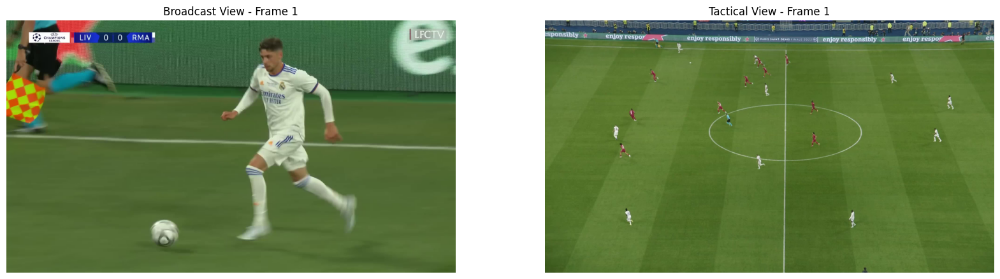

Processing frame 2...

0: 384x640 2 players, 1106.9ms
Speed: 3.0ms preprocess, 1106.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 2 players, 1106.9ms
Speed: 3.0ms preprocess, 1106.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


0: 384x640 22 players, 1 referee, 1225.7ms
Speed: 27.3ms preprocess, 1225.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 22 players, 1 referee, 1225.7ms
Speed: 27.3ms preprocess, 1225.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 3...

Processing frame 3...

0: 384x640 4 players, 1267.6ms
Speed: 3.6ms preprocess, 1267.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 players, 1267.6ms
Speed: 3.6ms preprocess, 1267.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 players, 1 referee, 1244.5ms
Speed: 2.8ms preprocess, 1244.5ms inference, 1.1ms postprocess per image at sh

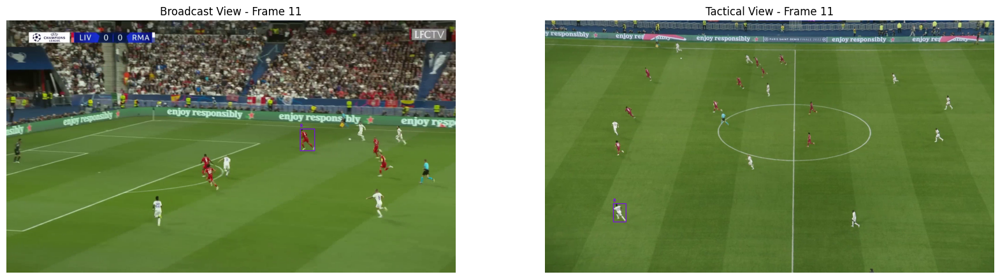

Processing frame 12...

0: 384x640 1 ball, 1 goalkeeper, 13 players, 1 referee, 1124.1ms
Speed: 2.2ms preprocess, 1124.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 1 goalkeeper, 13 players, 1 referee, 1124.1ms
Speed: 2.2ms preprocess, 1124.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 2 referees, 1132.5ms
Speed: 2.8ms preprocess, 1132.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 21 players, 2 referees, 1132.5ms
Speed: 2.8ms preprocess, 1132.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 13...

Processing frame 13...

0: 384x640 1 goalkeeper, 11 players, 1 referee, 1053.1ms
Speed: 2.5ms preprocess, 1053.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 11 players, 1 referee, 1053.1ms
Speed: 2.5ms preprocess, 1053.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

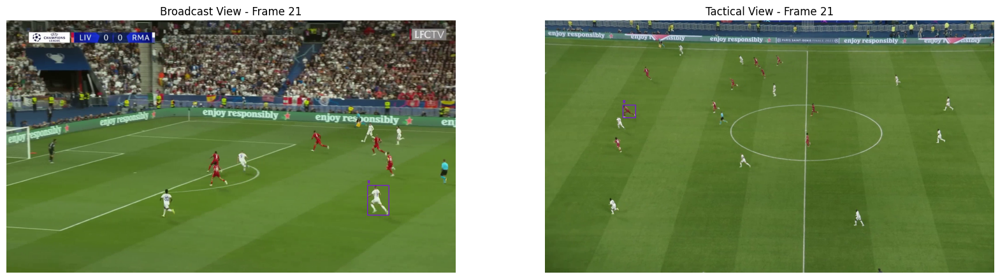

Processing frame 22...

0: 384x640 1 goalkeeper, 11 players, 2 referees, 1597.5ms
Speed: 2.5ms preprocess, 1597.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 11 players, 2 referees, 1597.5ms
Speed: 2.5ms preprocess, 1597.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 players, 1356.2ms
Speed: 3.8ms preprocess, 1356.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 22 players, 1356.2ms
Speed: 3.8ms preprocess, 1356.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 23...

Processing frame 23...

0: 384x640 1 ball, 1 goalkeeper, 11 players, 1 referee, 3708.0ms
Speed: 6.4ms preprocess, 3708.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 1 goalkeeper, 11 players, 1 referee, 3708.0ms
Speed: 6.4ms preprocess, 3708.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 player

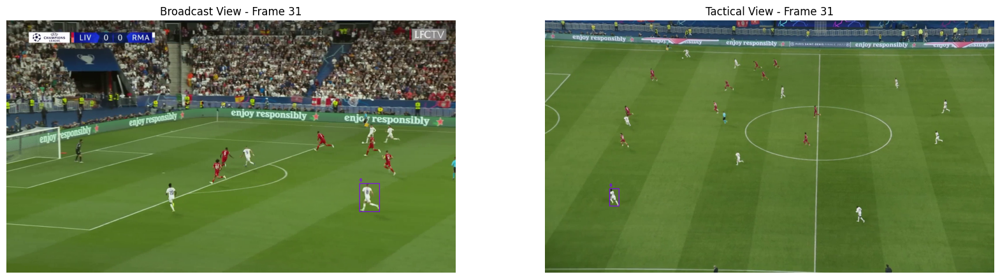

Processing frame 32...

0: 384x640 1 goalkeeper, 11 players, 3 referees, 1330.0ms
Speed: 2.7ms preprocess, 1330.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 11 players, 3 referees, 1330.0ms
Speed: 2.7ms preprocess, 1330.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 22 players, 1491.6ms
Speed: 2.7ms preprocess, 1491.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 1 ball, 22 players, 1491.6ms
Speed: 2.7ms preprocess, 1491.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 33...

Processing frame 33...

0: 384x640 1 goalkeeper, 13 players, 1 referee, 1567.6ms
Speed: 2.9ms preprocess, 1567.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 13 players, 1 referee, 1567.6ms
Speed: 2.9ms preprocess, 1567.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 2

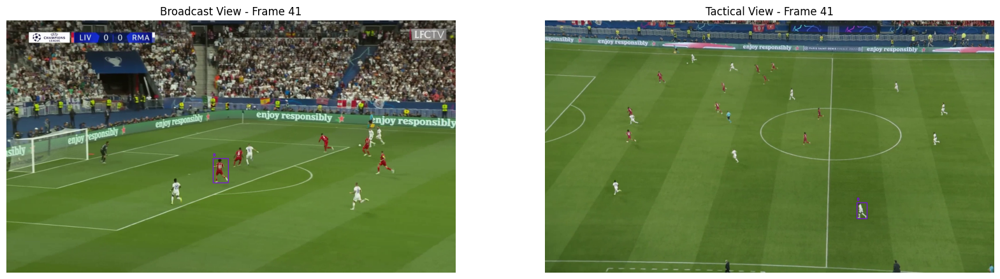

Processing frame 42...

0: 384x640 1 ball, 1 goalkeeper, 12 players, 1 referee, 1262.8ms
Speed: 2.3ms preprocess, 1262.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 1 goalkeeper, 12 players, 1 referee, 1262.8ms
Speed: 2.3ms preprocess, 1262.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 players, 1267.1ms
Speed: 3.0ms preprocess, 1267.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 23 players, 1267.1ms
Speed: 3.0ms preprocess, 1267.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 43...

Processing frame 43...

0: 384x640 1 goalkeeper, 13 players, 1 referee, 1232.3ms
Speed: 2.8ms preprocess, 1232.3ms inference, 10.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 13 players, 1 referee, 1232.3ms
Speed: 2.8ms preprocess, 1232.3ms inference, 10.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 2

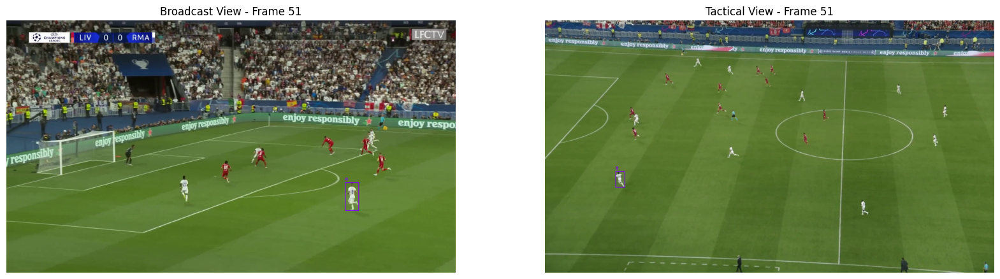

Processing frame 52...

0: 384x640 2 goalkeepers, 12 players, 1445.9ms
0: 384x640 2 goalkeepers, 12 players, 1445.9ms
Speed: 2.1ms preprocess, 1445.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

Speed: 2.1ms preprocess, 1445.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 2 referees, 1269.2ms
Speed: 3.9ms preprocess, 1269.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 21 players, 2 referees, 1269.2ms
Speed: 3.9ms preprocess, 1269.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 53...

Processing frame 53...

0: 384x640 11 players, 1 referee, 1379.6ms
Speed: 2.2ms preprocess, 1379.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 players, 1 referee, 1379.6ms
Speed: 2.2ms preprocess, 1379.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 2 referees, 1324.9ms
Speed: 2.8ms prepr

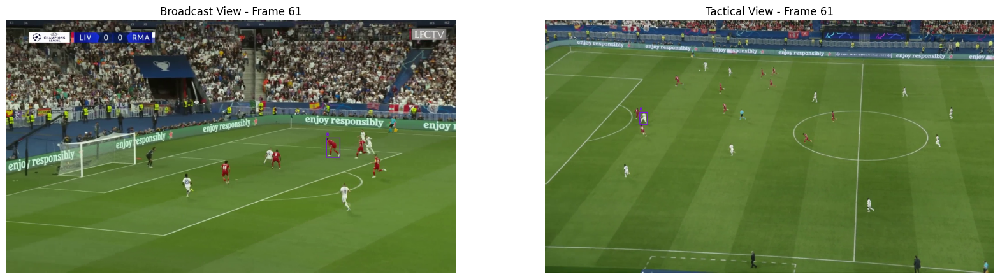

Processing frame 62...

0: 384x640 11 players, 3 referees, 2406.5ms
Speed: 12.7ms preprocess, 2406.5ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 players, 3 referees, 2406.5ms
Speed: 12.7ms preprocess, 2406.5ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 2 referees, 2364.2ms
Speed: 4.0ms preprocess, 2364.2ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 21 players, 2 referees, 2364.2ms
Speed: 4.0ms preprocess, 2364.2ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 63...

Processing frame 63...

0: 384x640 11 players, 1 referee, 1519.3ms
Speed: 3.5ms preprocess, 1519.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 players, 1 referee, 1519.3ms
Speed: 3.5ms preprocess, 1519.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 2 referees, 1302.3ms
Speed: 2.5ms preproces

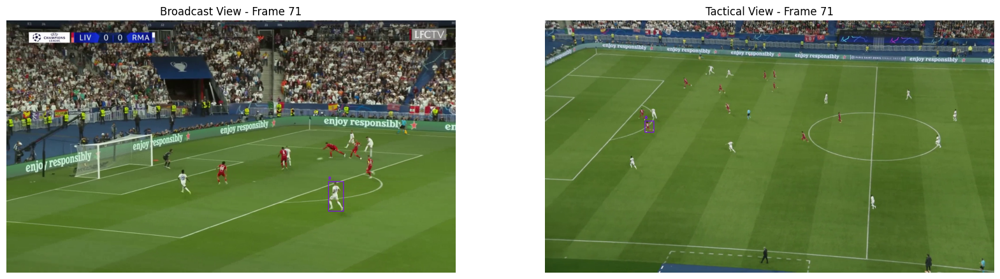

Processing frame 72...

0: 384x640 1 ball, 14 players, 2 referees, 1869.7ms
Speed: 2.6ms preprocess, 1869.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 14 players, 2 referees, 1869.7ms
Speed: 2.6ms preprocess, 1869.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 1 referee, 1398.2ms
Speed: 2.7ms preprocess, 1398.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 21 players, 1 referee, 1398.2ms
Speed: 2.7ms preprocess, 1398.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 73...

Processing frame 73...

0: 384x640 1 ball, 13 players, 1 referee, 1114.8ms
Speed: 4.7ms preprocess, 1114.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 13 players, 1 referee, 1114.8ms
Speed: 4.7ms preprocess, 1114.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 players, 1358.7ms
Speed:

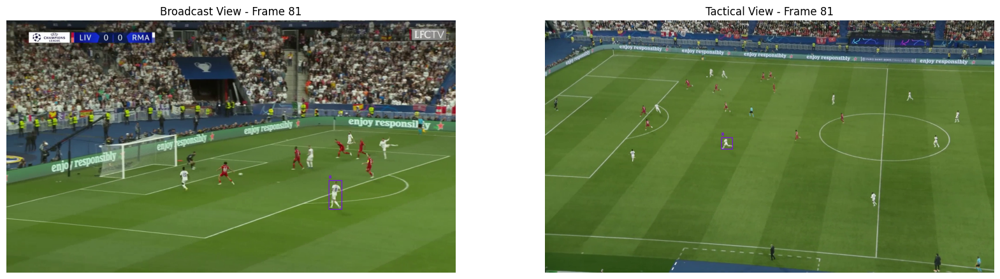

Processing frame 82...

0: 384x640 1 goalkeeper, 10 players, 1 referee, 1908.6ms
Speed: 2.7ms preprocess, 1908.6ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 10 players, 1 referee, 1908.6ms
Speed: 2.7ms preprocess, 1908.6ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 22 players, 1 referee, 1405.1ms
Speed: 3.6ms preprocess, 1405.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 1 ball, 22 players, 1 referee, 1405.1ms
Speed: 3.6ms preprocess, 1405.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 83...

Processing frame 83...

0: 384x640 1 ball, 1 goalkeeper, 10 players, 1 referee, 1130.2ms
Speed: 2.8ms preprocess, 1130.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 1 goalkeeper, 10 players, 1 referee, 1130.2ms
Speed: 2.8ms preprocess, 1130.2ms inference, 1.7ms postprocess per image at shape (1

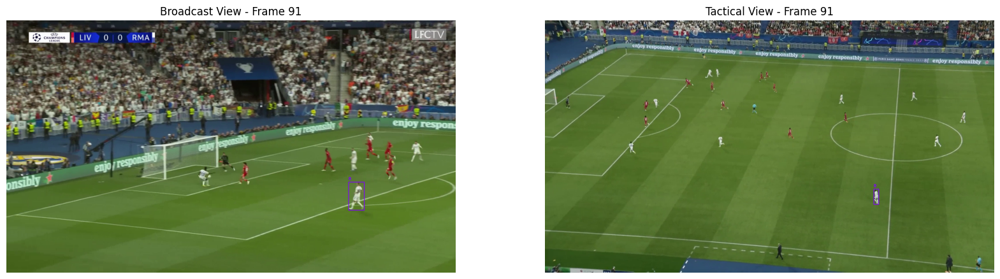

Processing frame 92...

0: 384x640 1 goalkeeper, 13 players, 1658.0ms
Speed: 2.3ms preprocess, 1658.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 13 players, 1658.0ms
Speed: 2.3ms preprocess, 1658.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 20 players, 2 referees, 1203.7ms
Speed: 2.7ms preprocess, 1203.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 1 goalkeeper, 20 players, 2 referees, 1203.7ms
Speed: 2.7ms preprocess, 1203.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Processing frame 93...

Processing frame 93...

0: 384x640 1 goalkeeper, 11 players, 1212.2ms
Speed: 2.4ms preprocess, 1212.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 11 players, 1212.2ms
Speed: 2.4ms preprocess, 1212.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 goalkeeper, 20 pl

In [17]:
# Create the pipeline
pipeline = PlayerTrackingPipeline(detector, feature_extractor, matcher)

# Process videos
results = pipeline.process_videos('broadcast.mp4', 'tacticam.mp4', max_frames=100)

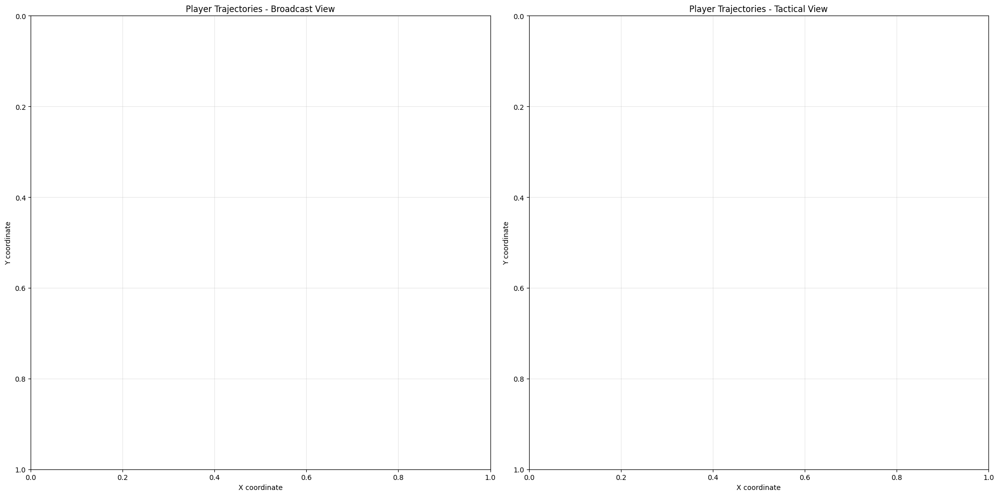

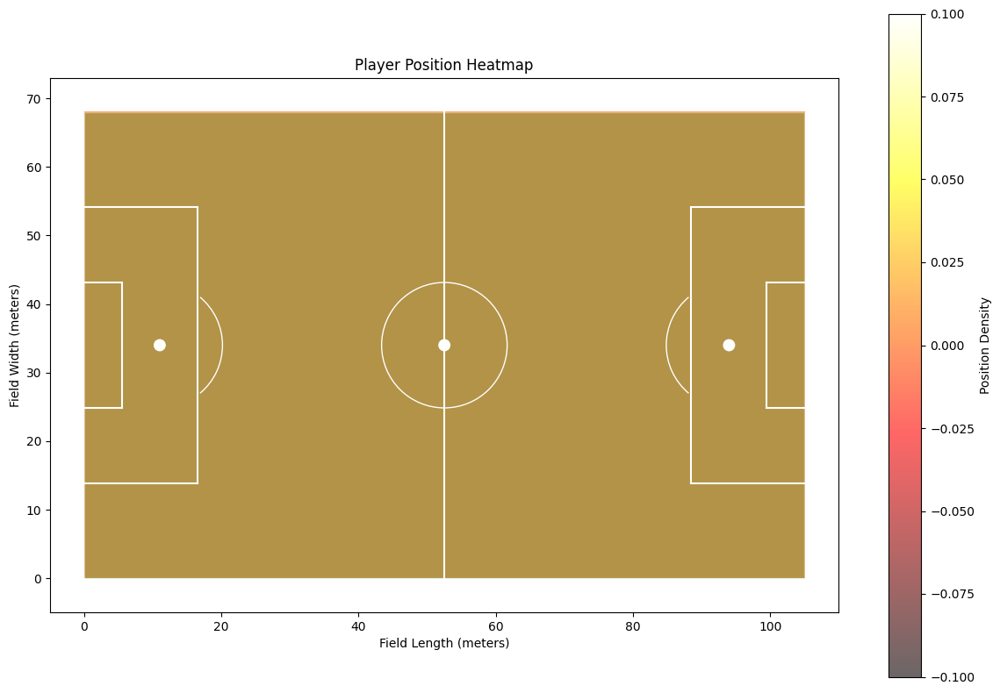

In [19]:
# Extract trajectory data from all_matches
matches_over_time = [match for match, _, _, _, _ in all_matches]
broadcast_detections_over_time = [broadcast_det for _, _, _, broadcast_det, _ in all_matches]
tacticam_detections_over_time = [tacticam_det for _, _, _, _, tacticam_det in all_matches]

# Visualize player trajectories
plot_player_trajectories(matches_over_time, broadcast_detections_over_time, tacticam_detections_over_time)

# Build player trajectories for heatmap
broadcast_trajectories = {}
for frame_idx, (_, broadcast_detections) in enumerate(zip(matches_over_time, broadcast_detections_over_time)):
	for b_idx, (x1, y1, x2, y2, _) in enumerate(broadcast_detections):
		b_id = f'broadcast_{b_idx}'
		center_x = (x1 + x2) / 2
		center_y = (y1 + y2) / 2
		
		if b_id not in broadcast_trajectories:
			broadcast_trajectories[b_id] = []
		
		broadcast_trajectories[b_id].append((frame_idx, center_x, center_y))

# Generate heatmap of player positions
generate_player_heatmap(broadcast_trajectories)

<Axes: >

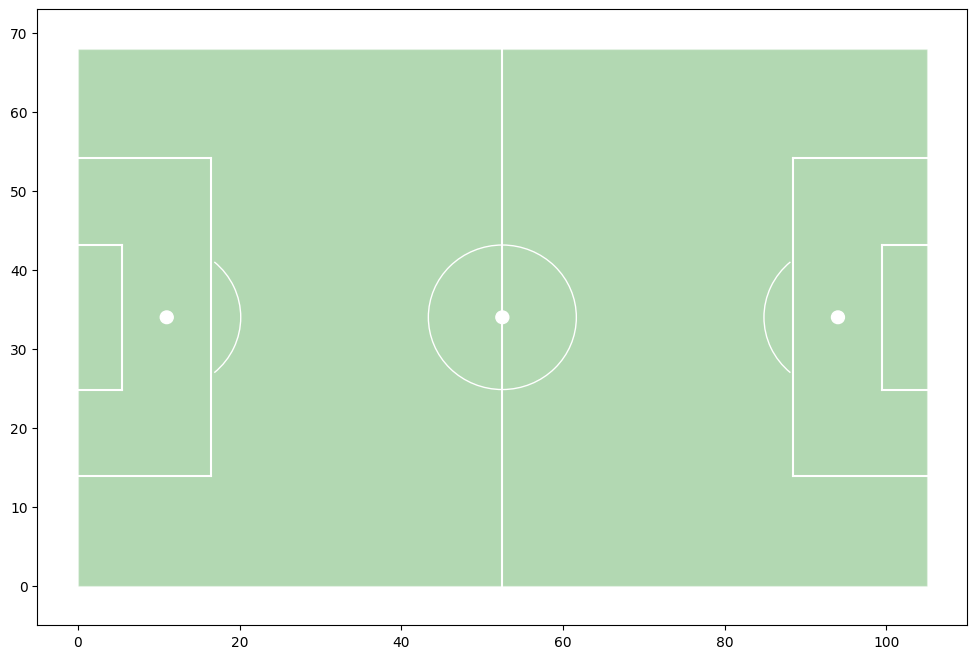

In [20]:
# Create a figure with a soccer field background
fig, ax = plt.subplots(figsize=(12, 8))
draw_soccer_field(ax)

# Plot player positions on the field
# ...